In [15]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [16]:
import torchvision
import torch
import torchvision.transforms as T
import torch.nn.functional as F
from torch import nn

tranform = T.Compose([
    T.Resize(256),
    T.ToTensor()
])

data = torchvision.datasets.ImageFolder(root = "/content/drive/MyDrive/gen_ai/archive", transform=tranform)
batch_size = 32
data_loader = torch.utils.data.DataLoader(data, batch_size=batch_size, shuffle=True)

In [17]:
train_loader = torch.utils.data.DataLoader(data, batch_size = batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(data, batch_size=batch_size, shuffle=True )

In [18]:
latent_dims = 128

class Encoder(nn.Module):
  def __init__(self, latent_dims=128):
    super().__init__()
    self.conv1 = nn.Conv2d(3, 32, 4, stride=2, padding = 1)
    self.conv2 = nn.Conv2d(32, 64, 4, stride = 2, padding = 1)
    self.batch2 = nn.BatchNorm2d(64)
    self.conv3 = nn.Conv2d(64, 128, 4, stride = 2, padding = 1)
    self.batch3 = nn.BatchNorm2d(128)
    self.conv4 = nn.Conv2d(128, 256, 4, stride = 2, padding = 1)
    self.batch4 = nn.BatchNorm2d(256)
    self.conv5 = nn.Conv2d(256, 512, 4, stride = 2, padding = 1)
    self.linear1 = nn.Linear(8*8*512, 1024)
    self.linear2 = nn.Linear(1024, latent_dims)
    self.linear3 = nn.Linear(1024, latent_dims)

    self.N = torch.distributions.Normal(0,1)
    self.N.loc = self.N.loc
    self.N.scale = self.N.scale

  def forward(self, x):
    x = x
    x = F.relu(self.conv1(x))
    x = F.relu(self.batch2(self.conv2(x)))
    x = F.relu(self.batch3(self.conv3(x)))
    x = F.relu(self.batch4(self.conv4(x)))
    x = F.relu(self.conv5(x))

    x = torch.flatten(x, start_dim = 1)
    x = F.relu(self.linear1(x))
    mu = self.linear2(x)
    std = torch.exp(self.linear3(x))
    z = mu + std * self.N.sample(mu.shape)
    return mu, std, z


In [19]:
!pip install torchsummary

In [20]:
from torchsummary import summary

encoderModel = Encoder()
summary(encoderModel, input_size=(3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]           1,568
            Conv2d-2           [-1, 64, 64, 64]          32,832
       BatchNorm2d-3           [-1, 64, 64, 64]             128
            Conv2d-4          [-1, 128, 32, 32]         131,200
       BatchNorm2d-5          [-1, 128, 32, 32]             256
            Conv2d-6          [-1, 256, 16, 16]         524,544
       BatchNorm2d-7          [-1, 256, 16, 16]             512
            Conv2d-8            [-1, 512, 8, 8]       2,097,664
            Linear-9                 [-1, 1024]      33,555,456
           Linear-10                  [-1, 128]         131,200
           Linear-11                  [-1, 128]         131,200
Total params: 36,606,560
Trainable params: 36,606,560
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.75
Fo

In [21]:
class Decoder(nn.Module):
    def __init__(self, latent_dims=128):
        super().__init__()
        self.linear1 = nn.Linear(latent_dims, 1024)
        self.linear2 = nn.Linear(1024, 8*8*512)

        self.deconv1 = nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1)
        self.batch1 = nn.BatchNorm2d(256)

        self.deconv2 = nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1)
        self.batch2 = nn.BatchNorm2d(128)

        self.deconv3 = nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1)
        self.batch3 = nn.BatchNorm2d(64)

        self.deconv4 = nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1)
        self.batch4 = nn.BatchNorm2d(32)

        self.deconv5 = nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1)

    def forward(self, x):
        x = F.relu(self.linear1(x))
        x = F.relu(self.linear2(x))
        x = x.view(-1, 512, 8, 8)

        x = F.relu(self.batch1(self.deconv1(x)))
        x = F.relu(self.batch2(self.deconv2(x)))
        x = F.relu(self.batch3(self.deconv3(x)))
        x = F.relu(self.batch4(self.deconv4(x)))
        x = torch.sigmoid(self.deconv5(x))

        return x


In [22]:
decoder = Decoder()
dummy_input = torch.randn(1, 128)
output = decoder(dummy_input)
print(output.shape)

torch.Size([1, 3, 256, 256])


In [24]:
class VAE(nn.Module):
  def __init__(self, latent_dims = 128):
    super().__init__()
    self.encoder = Encoder(latent_dims)
    self.decoder = Decoder(latent_dims)

  def forward(self, x):
    x = x
    mu, std, z = self.encoder(x)
    output = self.decoder(z)
    return mu, std, output

In [25]:
modelVAE = VAE()
lr = 1e-4
optimizer = torch.optim.Adam(modelVAE.parameters(), lr = lr, weight_decay = 1e-5)

In [26]:
def train_epoch(epoch):
  modelVAE.train()
  epoch_loss = 0.0
  for imgs, _ in train_loader:
    imgs = imgs
    mu, std, out = modelVAE(imgs)
    r_loss = ((imgs-out)**2).sum()
    KL = ((std**2)/2 + (mu**2)/2 - torch.log(std) - 0.5).sum()
    loss = r_loss + KL
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    epoch_loss += loss.item()
  print(f"Epoch {epoch}, Loss is {epoch_loss}")

In [27]:
import numpy as np
import matplotlib.pyplot as plt

def plot_each(model, latent_dims):
  model.eval()
  with torch.no_grad():
    latent = torch.randn(18, latent_dims)
    predicted_img = model.decoder(latent)
    grid = torchvision.utils.make_grid(predicted_img, nrow=6, padding=2,
                                       normalize=True)
    plt.figure(figsize=(8,4), dpi=100)
    plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
    plt.axis("off")
    plt.tight_layout()
    plt.show()

Epoch 1, Loss is 23636238.1875


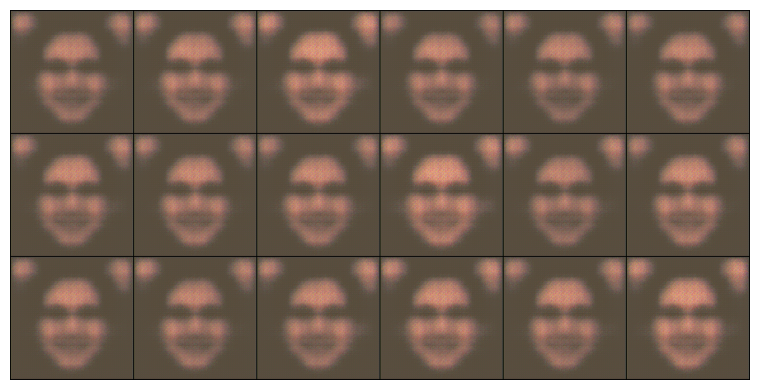

Epoch 2, Loss is 13739958.859375


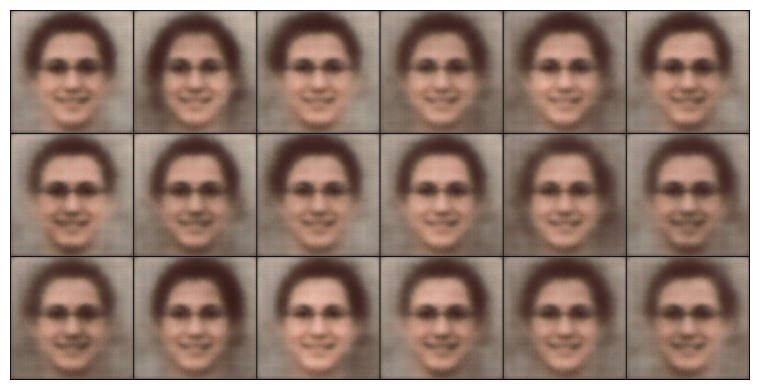

Epoch 3, Loss is 8368174.2734375


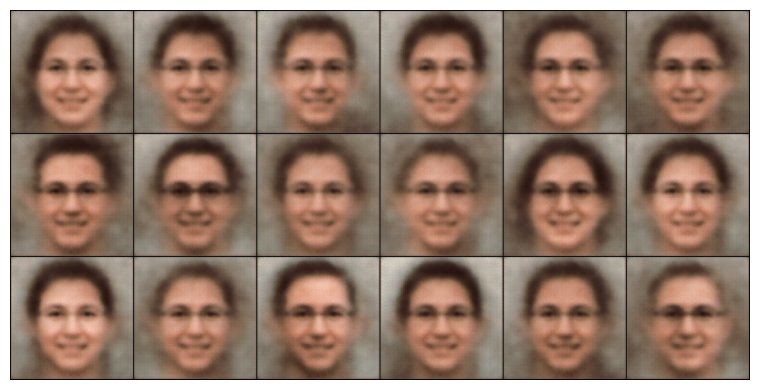

Epoch 4, Loss is 6697201.7890625


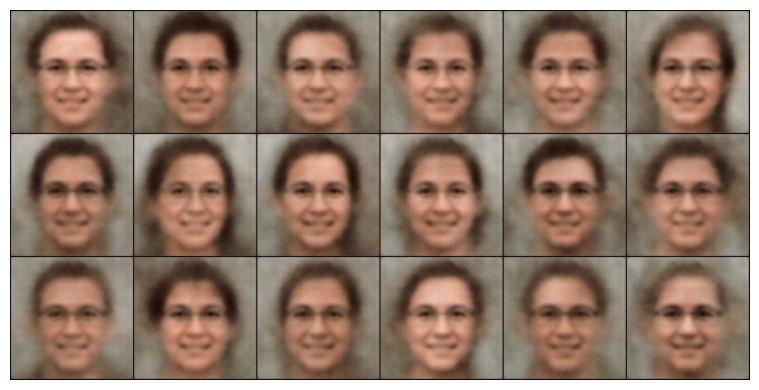

Epoch 5, Loss is 5828236.61328125


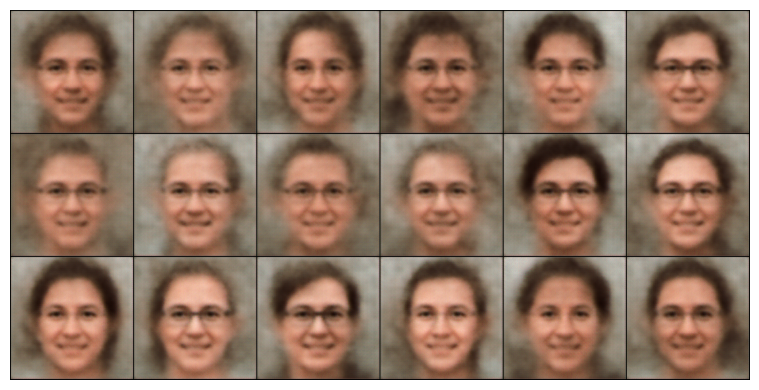

Epoch 6, Loss is 5367861.453125


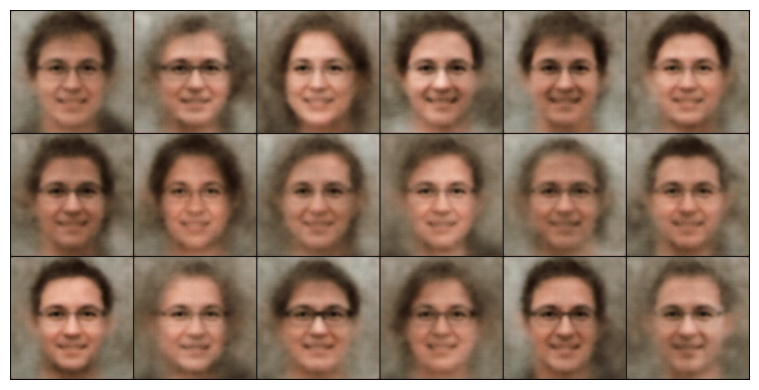

Epoch 7, Loss is 5031481.68359375


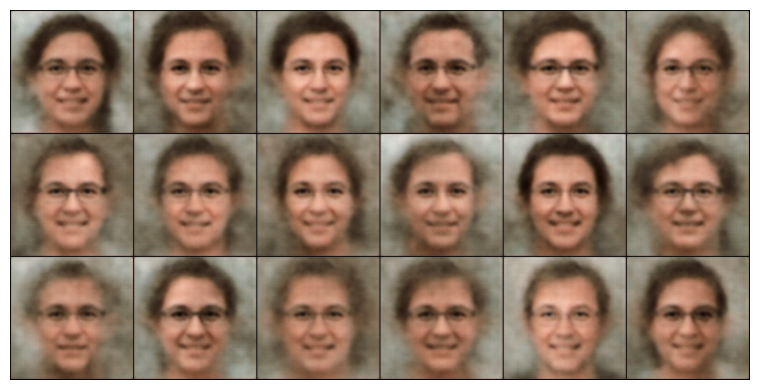

Epoch 8, Loss is 4723249.25


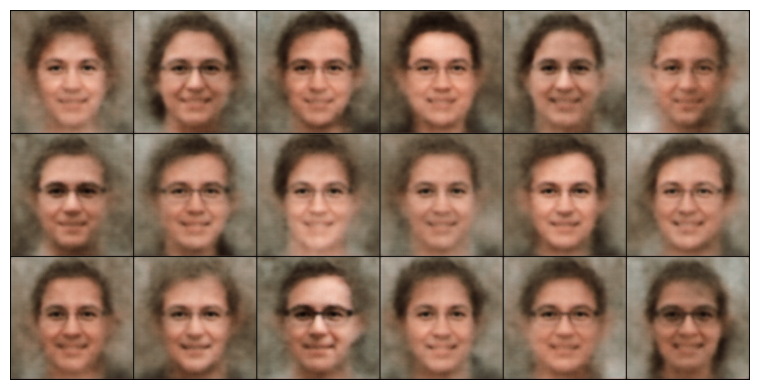

Epoch 9, Loss is 4482121.4140625


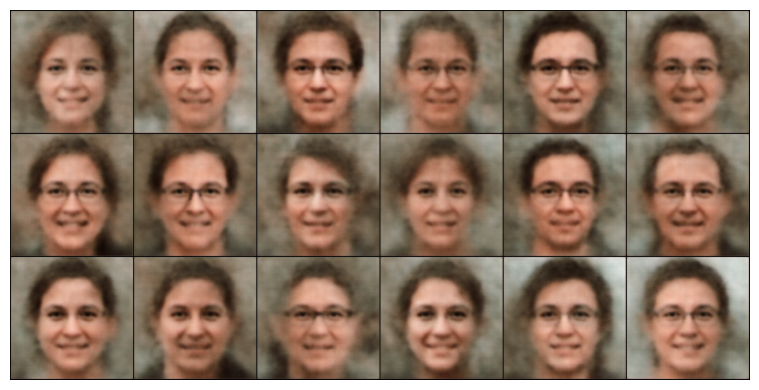

Epoch 10, Loss is 4264512.1171875


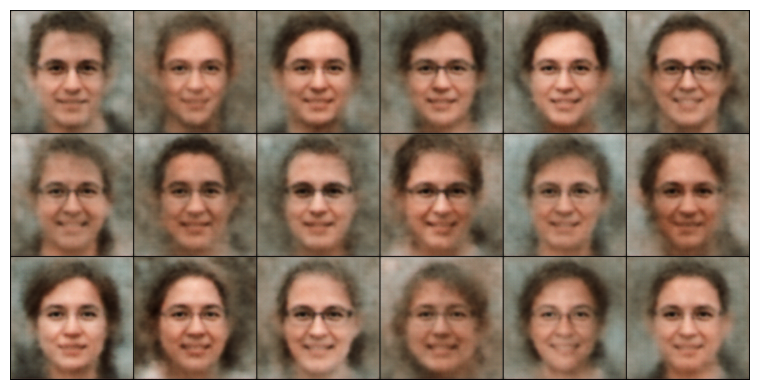

Epoch 11, Loss is 4020272.296875


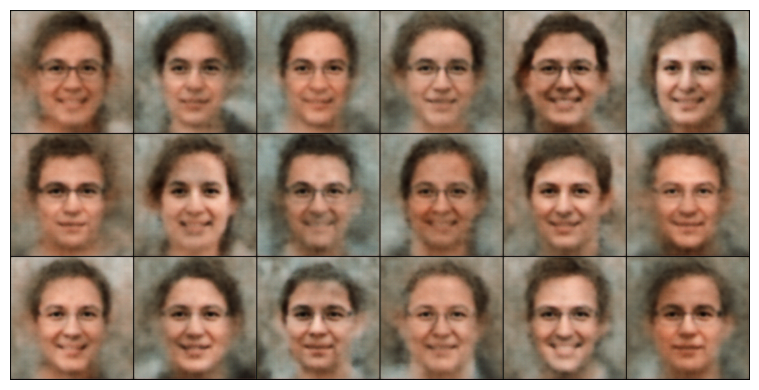

Epoch 12, Loss is 3880851.22265625


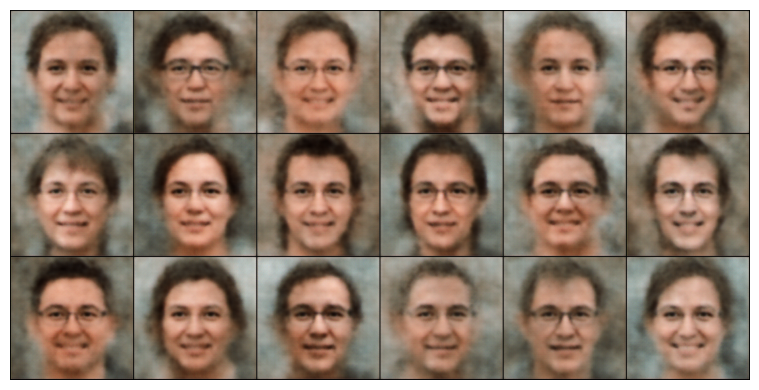

Epoch 13, Loss is 3737041.40625


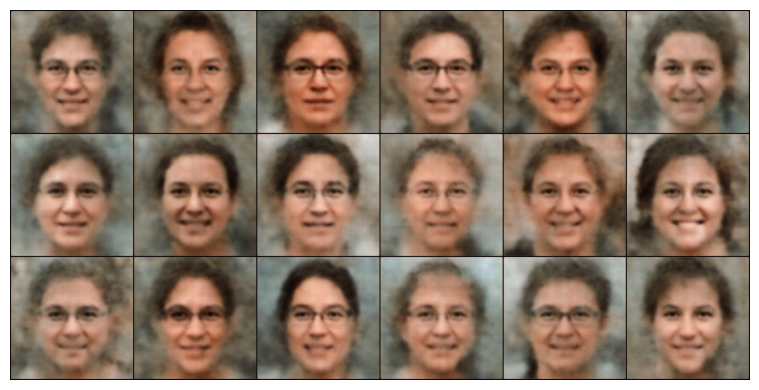

Epoch 14, Loss is 3635736.45703125


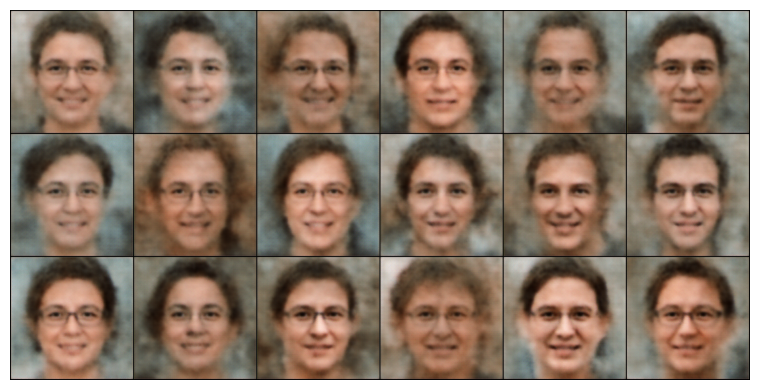

Epoch 15, Loss is 3486943.13671875


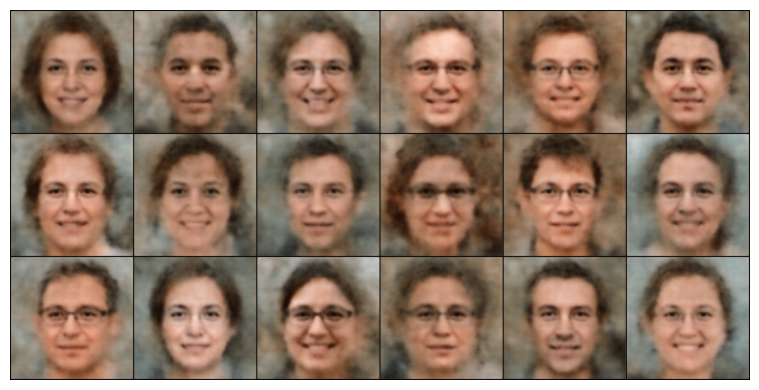

Epoch 16, Loss is 3353155.08984375


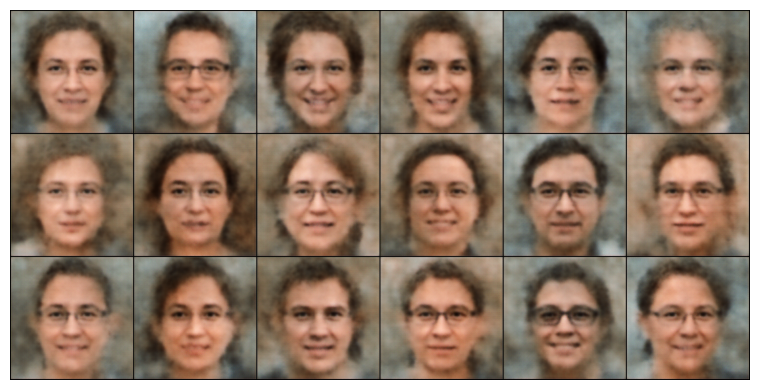

Epoch 17, Loss is 3265188.75390625


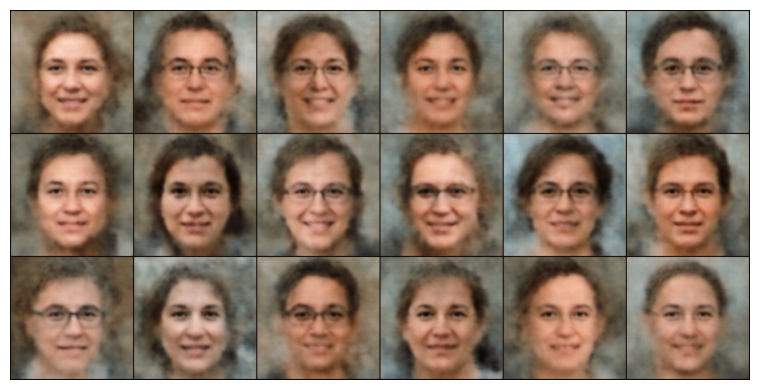

Epoch 18, Loss is 3155875.14453125


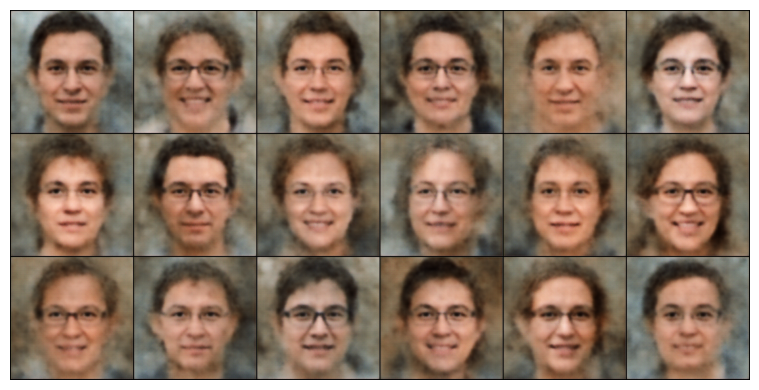

Epoch 19, Loss is 3072786.015625


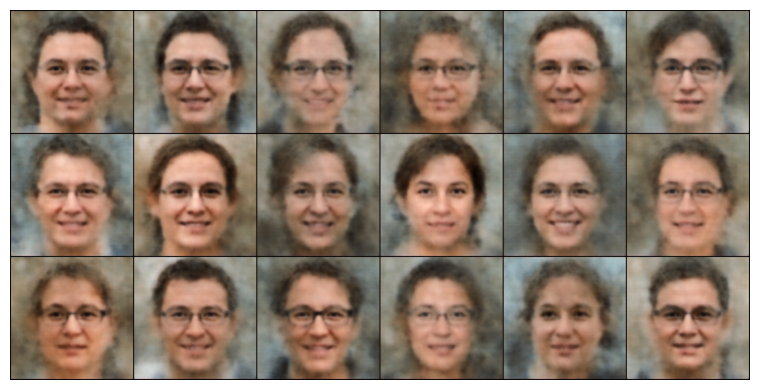

In [28]:
epochs = 20
for epoch in range(1, epochs):
  train_epoch(epoch)
  plot_each(model=modelVAE, latent_dims=latent_dims)

torch.save(modelVAE.state_dict(), 'model_vae.pth')